## LA BRETXA DIGITAL A L'HOSPITALET DE LLOBREGAT

#### Mariona Piqué Vidal

#### 1. Importem les llibreries 

In [1]:
# Importem les llibreries
from sklearn.datasets import make_regression
import numpy as np
import pandas as pd
%matplotlib notebook
from matplotlib import pyplot as plt
import scipy.stats
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import normalize


#### 2. Carreguem les dades

In [2]:
#Carreguem el dataset
# Funcio per a llegir dades en format csv
def load_dataset(path):
    dataset = pd.read_csv(path, delimiter=';')
    return dataset

# Carreguem el nostre dataset
dataset = load_dataset('BD_challenge.csv')
data = dataset.values
print("Dimensionalitat de la BBDD:", dataset.shape)

Dimensionalitat de la BBDD: (2000, 166)


Com podem veure, la nostra base de dades té 2000 files (nombre de persones que han contestat l'enquesta) i 166 columnes (preguntes que s'han fet a l'enquesta).

#### 3. Exploració prèvia de les dades

Abans de posar-nos a treballar amb les dades farem una exploració prèvia per a poder entendre una mica millor la base de dades amb la que treballarem.

In [3]:
# Fem una visualització de 10 files aleatòries
dataset.sample(n=10)

,NUMQ,ELEV,POND,DATA,HORA,METODE,LLENGUA,P0,P0A,I1,...,P8A11_rec,P8A12_rec,P8A13_rec,P8A14_rec,P8A15_rec,P8A16_rec,P8A17_rec,P8A18_rec,P8A19_rec,P8A_rec
97,475,"119,63636","1,0058674",6/13/2022,19:33:54,1,2,1,49,12,...,5,0,0,2,0,0,2,0,0,"1,368421053"
133,655,"119,7","1,0064025",6/13/2022,21:23:34,1,2,1,59,12,...,4,0,3,2,2,4,2,0,5,"2,684210526"
1177,5151,"115,38462","0,97012",6/21/2022,15:57:26,1,2,1,15,10,...,5,0,3,3,0,5,3,0,5,"2,631578947"
798,3141,"111,04","0,9335917",6/16/2022,19:04:29,1,2,1,66,6,...,0,0,0,2,0,0,1,0,0,1
1518,7639,"93,88235","0,7893353",6/28/2022,0:22:50,2,2,1,46,4,...,2,0,0,2,0,0,1,0,0,"1,157894737"
8,42,"119,2549","1,0026602",6/17/2022,18:53:12,1,2,1,10,6,...,3,4,5,2,2,0,,0,0,
393,1663,"119,59091","1,0054853",6/15/2022,11:48:44,2,2,1,47,12,...,4,0,3,1,2,1,3,0,5,"2,947368421"
597,2334,"119,975","1,0087146",6/15/2022,20:02:32,1,2,1,46,6,...,4,4,,2,2,4,2,0,0,
1825,8944,"118,5","0,9963132",07/04/2022,15:55:39,1,2,1,17,6,...,4,0,5,2,2,0,2,0,0,"2,105263158"
1852,9034,"123,5","1,0383518",07/04/2022,20:58:59,1,2,1,19,7,...,5,4,3,2,0,3,2,0,0,"2,421052632"


Podem observar que algunes variables no ens son d'interès, com ara les 7 primeres que ens donen informació de quan i com s'ha fet l'enquesta.

In [4]:
# Mirem la informació de cada una de les variables
dataset.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 166 columns):
 #    Column     Non-Null Count  Dtype 
---   ------     --------------  ----- 
 0    NUMQ       2000 non-null   int64 
 1    ELEV       2000 non-null   object
 2    POND       2000 non-null   object
 3    DATA       2000 non-null   object
 4    HORA       2000 non-null   object
 5    METODE     2000 non-null   int64 
 6    LLENGUA    2000 non-null   int64 
 7    P0         2000 non-null   int64 
 8    P0A        2000 non-null   int64 
 9    I1         2000 non-null   int64 
 10   DIST       2000 non-null   int64 
 11   I2         2000 non-null   int64 
 12   I3         2000 non-null   int64 
 13   I3COD      2000 non-null   int64 
 14   I4         2000 non-null   int64 
 15   I4A        2000 non-null   object
 16   I4COD      2000 non-null   int64 
 17   P1         2000 non-null   int64 
 18   P1A        2000 non-null   object
 19   P1B        2000 non-null   object
 20   P1C   

Com podem observar cap variable té NULLs i que el "data type" de les dades és int o object. Totes aquelles variables que estan amb format object l'haurem de convertir a int per a poder treballar bé.

###### Visualització de les dades

Abans de començar farem una petita visualització de com estan distribuides algunes de les variables que ens donen informació sobre l'habitant.

In [5]:
LABELS = ['Centre', 'Sanfeliu', 'Sant Josep',  'Collblanc', 'La Torrassa', 'SE o GS', 'La Florida', 'Les Planes', 'Can Serra', 'Pubilla Cases', 'El Gornal', 'Bellvitge']
count_classes = pd.value_counts(dataset['I1'], sort = False)
plt.figure(figsize=(13,5))
count_classes.plot(kind = 'bar', rot=0, color='steelblue')
plt.title("Distribució dels barris ")
plt.xticks(range(12), LABELS)
plt.xlabel("Barris")
plt.ylabel("Freqüència")
plt.show()

<IPython.core.display.Javascript object>

In [6]:
LABELS = ['De 16 a 24', 'De 25 a 34', 'De 35 a 49', 'De 50 a 64', 'De 65 a 74', 'De 75 i més']
count_classes = pd.value_counts(dataset['I3COD'], sort = False)
plt.figure(figsize=(10,5))
count_classes.plot(kind = 'bar', rot=0, color='steelblue')
plt.title("Distribució de les edats")
plt.xticks(range(6), LABELS)
plt.xlabel("Rang d'edat")
plt.ylabel("Freqüència")
plt.show()

<IPython.core.display.Javascript object>

In [7]:
LABELS = ['Home', 'Dona']
count_classes = pd.value_counts(dataset['I2'], sort = False)
plt.figure(figsize=(10,5))
count_classes.plot(kind = 'bar', rot=0, color='steelblue')
plt.title("Distribució del gènere")
plt.xticks(range(2), LABELS)
plt.xlabel("Gènere")
plt.ylabel("Freqüència")
plt.show()

<IPython.core.display.Javascript object>

Podem veure com hi ha un desequilibri en la quantitat d'habitants que han sigut enquestats segons el barri i edat, això ho haurem de tenir en compte al fer l'anàlisi.

#### 4. Preprocessament de les dades

##### 4.1. Neteja de les dades

Com hem vist anteriorment el nombre de variables de la nostra base de dades és molt elevat i per poder fer una bona modelització necessitem eliminar totes aquelles que no siguin necessàries per a l'estudi que estem fent. A més, haurem de corregir qualsevol inconsistència que ens trobem durant el procés, per tal, d'acabar amb la BD neta per poder treballar amb ella.

In [8]:
# Eliminem del dataset les 7 primeres variables (donen informació de quan i com es va fer l'enquesta), ja que, no aporten molta informació a l'estudi
DF = dataset.drop(['NUMQ', 'ELEV', 'POND','DATA', 'HORA', 'METODE', 'LLENGUA'], axis=1)
print("Dimensionalitat de la BBDD:", DF.shape)
DF.head()

Dimensionalitat de la BBDD: (2000, 159)


,P0,P0A,I1,DIST,I2,I3,I3COD,I4,I4A,I4COD,...,P8A11_rec,P8A12_rec,P8A13_rec,P8A14_rec,P8A15_rec,P8A16_rec,P8A17_rec,P8A18_rec,P8A19_rec,P8A_rec
0,1,40,9,5,1,70,5,1,,1,...,0,0,0,0,0,0,0,0,0,"0,421052632"
1,1,60,6,3,2,80,6,1,,1,...,0,0,0,0,0,0,0,0,0,"0,526315789"
2,1,49,3,1,2,51,4,1,,1,...,3,0,3,2,1,0,1,0,0,"1,736842105"
3,1,50,4,2,2,85,6,1,,1,...,0,0,0,0,0,0,0,0,0,0
4,1,44,1,1,2,44,3,1,,1,...,5,0,4,3,4,5,2,0,0,"3,052631579"


In [9]:
# Eliminem del dataset els atributs que corresponen a les preguntes relacionades amb la
# BRETXA DIGITAL AMB L’AJUNTAMENT DE L’HOSPITALET, que de moment no son del nostre interès.
idx_i = DF.columns.get_loc("P20")
idx_e = DF.columns.get_loc("P29A_99")
DF = DF.drop(DF.iloc[:, idx_i:idx_e+1],axis = 1)
print("Dimensionalitat de la BBDD:", DF.shape)
DF.head()

Dimensionalitat de la BBDD: (2000, 109)


,P0,P0A,I1,DIST,I2,I3,I3COD,I4,I4A,I4COD,...,P8A11_rec,P8A12_rec,P8A13_rec,P8A14_rec,P8A15_rec,P8A16_rec,P8A17_rec,P8A18_rec,P8A19_rec,P8A_rec
0,1,40,9,5,1,70,5,1,,1,...,0,0,0,0,0,0,0,0,0,"0,421052632"
1,1,60,6,3,2,80,6,1,,1,...,0,0,0,0,0,0,0,0,0,"0,526315789"
2,1,49,3,1,2,51,4,1,,1,...,3,0,3,2,1,0,1,0,0,"1,736842105"
3,1,50,4,2,2,85,6,1,,1,...,0,0,0,0,0,0,0,0,0,0
4,1,44,1,1,2,44,3,1,,1,...,5,0,4,3,4,5,2,0,0,"3,052631579"


In [10]:
#Mirem quins atributs queden al dataframe, per a mirar si en sobra algún
#for i in DF.keys():
    #print(i)

In [11]:
# Observem que les respostes de la pregunta 8 han estat rectificades, per tant, eliminem les preguntes que ens sobren
idx_i = DF.columns.get_loc("P8A1")
idx_e = DF.columns.get_loc("P8A19")
DF = DF.drop(DF.iloc[:, idx_i:idx_e+1],axis = 1)
DF = DF.drop(['P8A_rec'], axis=1)
print("Dimensionalitat de la BBDD:", DF.shape)
DF.head()

Dimensionalitat de la BBDD: (2000, 89)


,P0,P0A,I1,DIST,I2,I3,I3COD,I4,I4A,I4COD,...,P8A10_rec,P8A11_rec,P8A12_rec,P8A13_rec,P8A14_rec,P8A15_rec,P8A16_rec,P8A17_rec,P8A18_rec,P8A19_rec
0,1,40,9,5,1,70,5,1,,1,...,0,0,0,0,0,0,0,0,0,0
1,1,60,6,3,2,80,6,1,,1,...,0,0,0,0,0,0,0,0,0,0
2,1,49,3,1,2,51,4,1,,1,...,3,3,0,3,2,1,0,1,0,0
3,1,50,4,2,2,85,6,1,,1,...,0,0,0,0,0,0,0,0,0,0
4,1,44,1,1,2,44,3,1,,1,...,5,5,0,4,3,4,5,2,0,0


In [12]:
#Comprovem si hi ha algún usuari que no sigui resident, en cas negatiu eliminem l'atribut de la BD
for i in DF['P0']:
    if i != 1:
        print('Atenció! Hi ha un usuari no resident a la BD')
DF = DF.drop(['P0'], axis=1)
#En el cas de l'atribut P8A18_rec és un error de la BD, ja que, la pregunta P8A18 no forma part de l'enquesta.
#Fem la comprovació anterior igualment i l'eliminem de la BD.
for i in DF['P8A18_rec']:
    if i != 0:
        print('Atenció! Hi ha una resposta diferent!')
DF = DF.drop(['P8A18_rec'], axis=1)
print("Dimensionalitat de la BBDD:", DF.shape)
DF.head()

Dimensionalitat de la BBDD: (2000, 87)


,P0A,I1,DIST,I2,I3,I3COD,I4,I4A,I4COD,P1,...,P8A9_rec,P8A10_rec,P8A11_rec,P8A12_rec,P8A13_rec,P8A14_rec,P8A15_rec,P8A16_rec,P8A17_rec,P8A19_rec
0,40,9,5,1,70,5,1,,1,2,...,0,0,0,0,0,0,0,0,0,0
1,60,6,3,2,80,6,1,,1,2,...,5,0,0,0,0,0,0,0,0,0
2,49,3,1,2,51,4,1,,1,1,...,0,3,3,0,3,2,1,0,1,0
3,50,4,2,2,85,6,1,,1,2,...,0,0,0,0,0,0,0,0,0,0
4,44,1,1,2,44,3,1,,1,1,...,2,5,5,0,4,3,4,5,2,0


In [13]:
# Observem que la columna I4A té buits i ja està codificada, així que l'eliminem
DF = DF.drop(['I4A'], axis=1)
#Fem el mateix amb la columna P2AP que no ens interessa mantenir-la
DF = DF.drop(['P2AP'], axis=1)
print("Dimensionalitat de la BBDD:", DF.shape)
DF.head()

Dimensionalitat de la BBDD: (2000, 85)


,P0A,I1,DIST,I2,I3,I3COD,I4,I4COD,P1,P1A,...,P8A9_rec,P8A10_rec,P8A11_rec,P8A12_rec,P8A13_rec,P8A14_rec,P8A15_rec,P8A16_rec,P8A17_rec,P8A19_rec
0,40,9,5,1,70,5,1,1,2,,...,0,0,0,0,0,0,0,0,0,0
1,60,6,3,2,80,6,1,1,2,,...,5,0,0,0,0,0,0,0,0,0
2,49,3,1,2,51,4,1,1,1,2,...,0,3,3,0,3,2,1,0,1,0
3,50,4,2,2,85,6,1,1,2,,...,0,0,0,0,0,0,0,0,0,0
4,44,1,1,2,44,3,1,1,1,2,...,2,5,5,0,4,3,4,5,2,0


In [14]:
#Comprovem que no hi hagi cap NULL als atributs
for i in DF.isnull().sum():
    if i < 0:
        print('Alerta! Hi ha un NULL a la variable', i)

In [15]:
# Si observem la BD hi ha espais en buit que en comptes d'estar com a None són del tipus ' ', això,
# coincideix amb les columnes de tipus objecte, subtituim aquests buits per 999 (pregunta no preguntada/contestada)
DF1 = DF

for i,j in zip(DF1.dtypes, DF1.keys()):
    pos = 0
    if i == "object":
        for k in DF1[j]:
            if k == ' ':
                DF1.at[pos,j] = 999
            pos += 1

DF1.head()

,P0A,I1,DIST,I2,I3,I3COD,I4,I4COD,P1,P1A,...,P8A9_rec,P8A10_rec,P8A11_rec,P8A12_rec,P8A13_rec,P8A14_rec,P8A15_rec,P8A16_rec,P8A17_rec,P8A19_rec
0,40,9,5,1,70,5,1,1,2,999,...,0,0,0,0,0,0,0,0,0,0
1,60,6,3,2,80,6,1,1,2,999,...,5,0,0,0,0,0,0,0,0,0
2,49,3,1,2,51,4,1,1,1,2,...,0,3,3,0,3,2,1,0,1,0
3,50,4,2,2,85,6,1,1,2,999,...,0,0,0,0,0,0,0,0,0,0
4,44,1,1,2,44,3,1,1,1,2,...,2,5,5,0,4,3,4,5,2,0


In [16]:
# Per tal, de poder treballar bé amb el dataframe, transformem es variables amb format objecte a int
for i,j in zip(DF1.dtypes, DF1.keys()):
    if i == "object":
        DF1[j] = DF1[j].astype('int64')

DF1.dtypes

P0A          int64
I1           int64
DIST         int64
I2           int64
I3           int64
             ...  
P8A14_rec    int64
P8A15_rec    int64
P8A16_rec    int64
P8A17_rec    int64
P8A19_rec    int64
Length: 85, dtype: object

Un cop hem fet la neteja de dades, ens hem quedat amb 85 atributs que corresponen a les preguntes que s'han fet i que ens són d'interès per l'anàlisi.

#### 5. Anàlisis multivariat

Per tal d'identificar les variables latents, fem una anàlisi multivariant utilitzant la matriu de correlació. Aquesta ens permetrà veure la correlació entre variables.

In [17]:
plt.figure(figsize=(51,51))
sns.heatmap(DF1.corr(),annot=True, fmt='.0%', cmap='PuBu')
plt.savefig('corr.png')

<IPython.core.display.Javascript object>

A partir de la matriu de correlació podem observar el següent:
- Correlació elevada entre preguntes del mateix bloc (es pot veure sobretot al voltant de la diagonal)
- Poques variables tenen una correlació amb preguntes d'altres blocs (variables latents), aquestes són:
    - Edat
    - Preguntes sobre la connexió a la llar
    - Preguntes sobre dispositius personal
    - Preguntes sobre l'ús
    - Preguntes sobre formació informàtica
- Pel que fa a la variable dels barris podem observar que no mostra una correlació significativa amb cap variable, excepte el districte.

##### 5.1. Feature selection

Partint de l'anàlisi multivariant reduirem la dimensionalitat de la base de dades amb la que treballarem seleccionant aquelles variables latents per tal de millorar el rendiment del nostre anàlisi, eliminant-ne soroll.

In [18]:
#Feature selection
DF_fs = DF1.loc[:, ['I1', 'I2', 'I3COD', 'P1', 'P1A', 'P1B', 'P1C', 'P2AT', 'P3A', 'P4', 'P5', 'P6','P7', 'P10', 'P11_1', 'P11_2', 'P11_3', 'P11_4', 'P32','P37']] # Columnas tip, sex y day

<IPython.core.display.Javascript object>


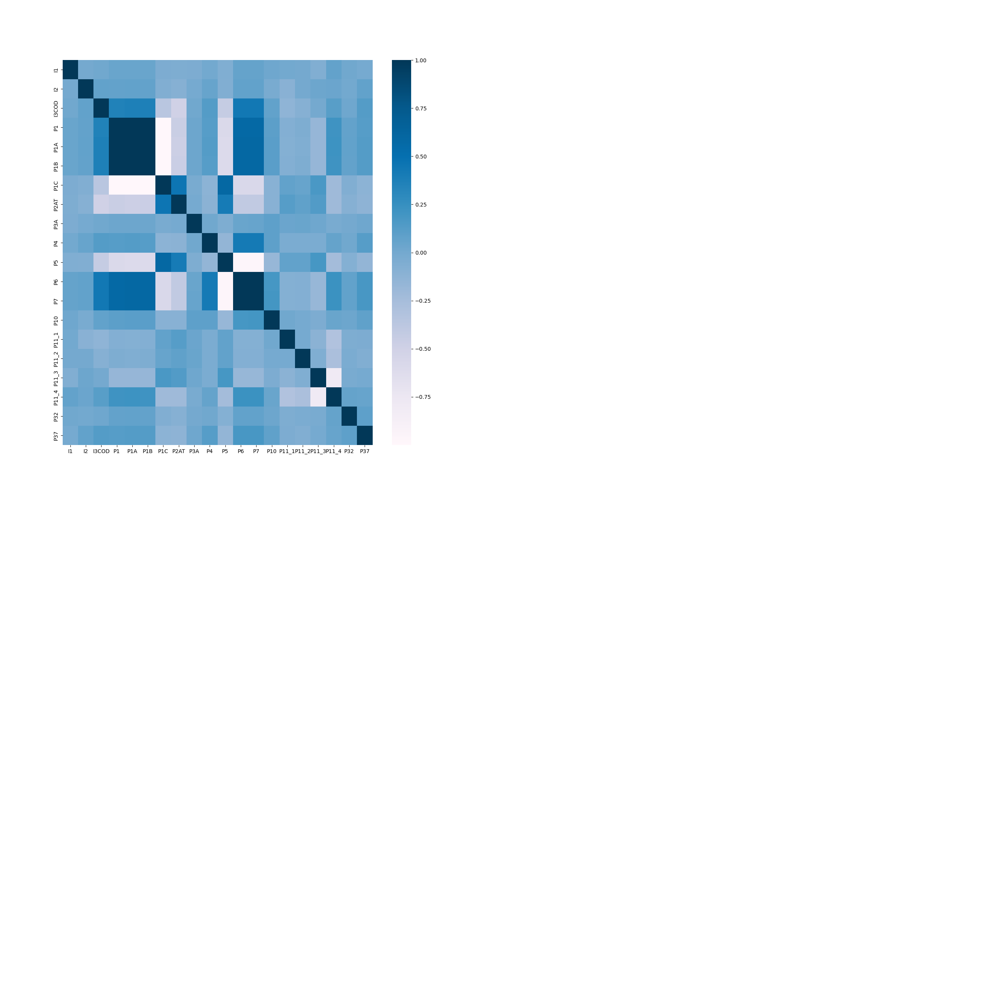

In [19]:
plt.figure(figsize=(13,13))
sns.heatmap(DF_fs.corr(),annot=True, fmt='.0%', cmap='PuBu')
plt.savefig('corr_fs.png')

In [20]:
#Visualitzem el núvol de dades
fig=plt.figure()
ax=fig.add_subplot(111,projection='3d')
ax.scatter(DF_fs['I1'], DF_fs['P1'], DF_fs['I3COD'])
ax.set_xlabel('Barri')
ax.set_ylabel('Edat')
ax.set_zlabel('Connexió')
plt.title('Núvol de punts abans del PCA')
plt.show()
plt.savefig('nuv_abans.png')

<IPython.core.display.Javascript object>

Al tenir un núvol de punts molts confús, ens interessa aplicar PCA.

#### 6. Principle Component Analysis

Per tal de facilitar la classificació, aplicarem el PCA. Aquest ens permet reduir de dimensionalitat de la BD perdent la menor quantitat d'informació possible. Això, simplifica la nostra BD i a més, ens ajuda a entendre la nostra base de dades.

In [21]:
#Mirem quantes components són necessàries per a represntar un 99% del nostre dataset
pca=PCA(.99)
dt_pca = pca.fit_transform(DF_fs)
dt_pca = pd.DataFrame(data = dt_pca)
expl = pca.explained_variance_ratio_ 
print(expl)
print("\nNombre de components necessàries: "+ str(len(expl))+"\n")
print('suma:', sum(expl))

[0.79088504 0.19671357 0.00756697]

Nombre de components necessàries: 3

suma: 0.9951655886574974


In [22]:
pca=PCA(.90)
dt_pca = pca.fit_transform(DF_fs)
dt_pca = pd.DataFrame(data = dt_pca)
expl = pca.explained_variance_ratio_ 
print(expl)
print("\nNombre de components necessàries: "+ str(len(expl))+"\n")
print('suma:', sum(expl))

[0.79088504 0.19671357]

Nombre de components necessàries: 2

suma: 0.987598617410737


In [23]:
pca=PCA(.95)
dt_pca = pca.fit_transform(DF_fs)
dt_pca = pd.DataFrame(data = dt_pca)
expl = pca.explained_variance_ratio_ 
print(expl)
print("\nNombre de components necessàries: "+ str(len(expl))+"\n")
print('suma:', sum(expl))

[0.79088504 0.19671357]

Nombre de components necessàries: 2

suma: 0.987598617410737


Podem veure que per explicar el nostre DF al 99% ens calen només 3 components, per això construirem un DF amb aquestes 3 component que obtenim aplicant el PCA.

In [24]:
#Creem un BD amb les 3 components
pca = PCA(n_components = 3)
pca.fit(DF_fs)
pca_samples = pca.transform(DF_fs)

BD_pca = pd.DataFrame(pca_samples)
BD_pca.shape

(2000, 3)

In [25]:
#Visualitzem el núvol de dades
fig=plt.figure()
ax=fig.add_subplot(111,projection='3d')
ax.scatter(BD_pca[0], BD_pca[2], BD_pca[1])
ax.set_xlabel('Component 0')
ax.set_ylabel('Component 2')
ax.set_zlabel('Compoenent 3')
plt.title('Núvol de punts del PCA')
plt.show()
plt.savefig('pca.png')

<IPython.core.display.Javascript object>

Com podem observar el PCA ens ha simplificat molt la visualització del nostre DF, inclús podem observar que podem tenir fins a 5-6 possibles perfils diferents.

#### 6. Classificació

Un cop ja tenim les dades preparades podem començar a treballar amb el model. Al voler tipificar els perfils hem de fer servir un model d'aprenentatge no supervisat. Per això, tenint en compte que després d'aplicar el PCA ens quedava un núvol de punts on es poden distingir fàcilment les possibles agrupacions l'algoritme de K-means pot donar bons resultats.
 - Objectiu: Trobar k clústers entre les dades d'entrada a partir de l'ús de centroides 

##### 6.1. K-means

Primerament, buscarem el nombre de clústers adecuat. A partir, de la visualització anterior hem pogut observar que les dades estan distribuides entre 5-6 agrupacions. Tot i així, acabarem de prendre la decisió a partir dels mètodes "Elbow method" i el "Silhouette methd".

In [26]:
#Elbow method
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(BD_pca)
    distortions.append(kmeanModel.inertia_)
    
plt.figure(figsize=(10,6))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()
plt.savefig('elbow.png')

<IPython.core.display.Javascript object>

In [27]:
from yellowbrick.cluster import SilhouetteVisualizer
 
fig, ax = plt.subplots(3, 2, figsize=(10,8))
for i in [2, 3, 4, 5, 6, 7]:
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=42)
    q, mod = divmod(i, 2)
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(BD_pca) 

<IPython.core.display.Javascript object>

Si ens guiem d'aquests dos mètodes, pel primer ens ha sortit k=4 i pel segon, tot i que no acaben de complir les dues condicions (mida similar de les siluetes i que casa una sobrepassi el score mitjà del DF), ens quedaríem amb k=4 o 5.

Partint, d'això i la visualització del núvol de dades ens decantem per k=4.

In [28]:
clusterer = KMeans(n_clusters=4).fit(BD_pca)
centers = clusterer.cluster_centers_
c_preds = clusterer.predict(BD_pca)

print(centers)

[[ -256.99187016     7.44296918    -3.36923015]
 [ 2162.55201137   217.87668704   -19.26498262]
 [ 1055.59492745 -1094.06155135    24.78673065]
 [  831.93347845  1214.4369342     96.71287411]]


Visualització del núvol de dades després de la classificació.

In [29]:
#Visualitzem el núvol de dades
import matplotlib.colors
cmaps = matplotlib.colors.LinearSegmentedColormap.from_list("", ['steelblue', 'cornflowerblue', 'lightsteelblue', 'skyblue'])
fig=plt.figure()
ax=fig.add_subplot(111,projection='3d')
ax.scatter(BD_pca[0], BD_pca[2], BD_pca[1], c = c_preds, cmap = cmaps)
ax.set_xlabel('Component 0')
ax.set_ylabel('Component 2')
ax.set_zlabel('Compoenent 3')
plt.title('Núvol de punts del PCA després de la classificació')
plt.show()
plt.savefig('pca_class.png')

<IPython.core.display.Javascript object>

In [30]:
fig = plt.figure(figsize=(10,8))
plt.scatter(BD_pca[1],BD_pca[0],c = c_preds, cmap = cmaps)
for ci,c in enumerate(centers):
    plt.plot(c[1], c[0], 'o', markersize=8, color='red', alpha=1)

plt.xlabel('Component 1')
plt.ylabel('Component 0')

plt.title('Núvol de punts després de la classificació en els eixos 2D')
plt.show()
plt.savefig('pca_class2D.png')

<IPython.core.display.Javascript object>

In [31]:
#Afegim a la BD la columna de prediccions
DF_class2 = DF1 
DF_class2['cluster'] = c_preds

DF_class2.head(10)

,P0A,I1,DIST,I2,I3,I3COD,I4,I4COD,P1,P1A,...,P8A10_rec,P8A11_rec,P8A12_rec,P8A13_rec,P8A14_rec,P8A15_rec,P8A16_rec,P8A17_rec,P8A19_rec,cluster
0,40,9,5,1,70,5,1,1,2,999,...,0,0,0,0,0,0,0,0,0,2
1,60,6,3,2,80,6,1,1,2,999,...,0,0,0,0,0,0,0,0,0,2
2,49,3,1,2,51,4,1,1,1,2,...,3,3,0,3,2,1,0,1,0,0
3,50,4,2,2,85,6,1,1,2,999,...,0,0,0,0,0,0,0,0,0,1
4,44,1,1,2,44,3,1,1,1,2,...,5,5,0,4,3,4,5,2,0,0
5,45,7,4,2,66,5,1,1,1,2,...,0,0,0,0,0,2,0,0,0,0
6,22,12,6,2,24,1,1,1,1,2,...,0,4,0,3,0,0,0,3,4,0
7,49,5,2,2,89,6,1,1,1,98,...,0,0,0,0,0,0,0,0,0,3
8,10,6,3,2,39,3,1,1,1,2,...,4,3,4,5,2,2,0,999,0,0
9,30,10,5,1,56,4,1,1,1,2,...,4,0,0,0,0,0,0,0,0,0


#### 7. Interpretar els perfils

Un cop ja s'ha assignat un perfil a cada habitant, ja podem interpretar cada un dels perfils. Això ho farem a partir de la visualització de diferents variables per a cada clúster.

In [32]:
c0 = DF_class2[DF_class2['cluster']==0].drop('cluster',axis=1)
c1 = DF_class2[DF_class2['cluster']==1].drop('cluster',axis=1)
c2 = DF_class2[DF_class2['cluster']==2].drop('cluster',axis=1)
c3 = DF_class2[DF_class2['cluster']==3].drop('cluster',axis=1)
#c4 = DF_class2[DF_class2['cluster']==4].drop('cluster',axis=1)

In [33]:
#Distribució dels usuaris dins els clusters
num = []
for i in range(0,4):
    num.append(len(DF_class2[DF_class2['cluster']==i]))
    
plt.figure()
label = ['C0', 'C1', 'C2', 'C3']
plt.pie(num, autopct="%0.1f %%", colors=['steelblue', 'cornflowerblue', 'lightsteelblue', 'skyblue', 'yellowgreen','gold', 'orange','olivedrab'])
plt.title('Distribució dels clusters')
plt.legend(label, loc='upper right')
plt.show()
plt.savefig('dist.png')

<IPython.core.display.Javascript object>

Podem observar que el clúster 0 conté una gran part dels habitants enquestats. A continuació, estudiarem cada un d'ells per a poder entendre aquest fet.

In [34]:
#Funció implementada per a fer els pie plots
def pie_plot(df, var, labels, t):
    num = []
    for i in range(1,len(labels)+1):
        num.append(len(df[df[var]==i]))
    
    plt.figure()
    plt.pie(num, autopct="%0.1f %%", colors=['steelblue', 'cornflowerblue', 'lightsteelblue', 'skyblue', 'rebeccapurple', 'darkorchid', 'palevioletred', 'crimson', 'yellowgreen','gold', 'orange','olivedrab'])
    plt.title(t)
    plt.legend(labels, loc='upper right')
    plt.show()

In [35]:
#Diccionari amb les etiquetes de les respostes d'algunes preguntes
l = dict()
l['I3COD'] = ['De 16 a 24', 'De 25 a 34', 'De 35 a 49', 'De 50 a 64', 'De 65 a 74', 'De 75 i més']
l['I2'] = ['Home', 'Dona']
l['I4'] = ['Espanyola', 'Estrangera (anoteu nacionalitat)', 'Espanyola i estrangera']
l['P1'] = ['Sí', 'No']
l['P30'] = ['Sense estudis', 'Primaris', 'Secundaris obligatoris', 'Secundaris postobligatoris', 'Universitaris', 'NS', 'NC']
l['P31'] = ['Treballa' , 'Autònom o empresari', 'A l’atur', 'Jubilat/da / pensionista', 'Tasques de la llar no remunerades', 'Estudiant', 'Ni treballa ni estudia','Altra','NS', 'Nc']
l['P1C'] = ['Motius econòmics','Tècnics', 'Habilitats', 'Motivació/interès', 'Diversitat funcional', 'Altres alternatives', 'Altres', 'NS', 'NC']
l['P3A'] = ['Sí', 'No', 'NC']
l['P3B'] = ['Fins a 2 anys', '2-4 anys', 'Més de 4 anys', 'NS', 'NC']
l['P3C'] = ['Sí', 'No', 'NC']
l['P3E'] = ['Per motius econòmics', 'No m’interessa','No sé fer servir Internet', 'Em connecto d’altres maneres', 'Altres', 'NS', 'NC']
l['P4'] = ['Diàriament', 'Alguns cops per setmana', 'Alguns cops al mes', 'Algun cop l’any (> 3 mesos sense usar-lo)', 'Menys d’un cop l’any', 'Mai','NS','NC']
l['P10'] = ['0','1','2','3','4','5','6','7','8','9','10']
l['P5'] = ['Motius de capacitació', 'Motius motivacionals', 'Motius econòmics', 'Motius tècnics','Alguna persona ho fa per mi', 'Va en contra dels meus valors', 'Pel tractament de les dades personals i seguretat', 'Altres','NS','NC']
l['P1A'] = ['ADSL', 'Fibra', 'Dades mòbils', 'Satèl·lit', 'Altres', 'NS', 'NC']
l['P6'] = ['Smartphone', 'Tauleta', 'Portàtil', 'Ordinador de sobretaula', 'Consoles de videojocs', 'SMART TV', 'NS', 'NC']
l['P8'] = ['Menys d’un cop l’any', 'Algun cop l’any', 'Alguns cops al mes', 'Alguns cops per setmana','Diàriament']
l['P11'] =  ['Estudis TIC', 'Títulació oficial', 'Curs d’informàtica', 'Mai n`he fet', 'NS', 'NC']
l['P12'] =  ['Sí', 'No', 'NC']
l['P13'] =  ['Sí', 'No', 'NC']
l['P14'] =  ['Molt', 'Bastant', 'Regular', 'Poc', 'Gens fiable', 'NS', 'NC']
l['P15'] =  ['Sí', 'No', 'NC']
l['P16'] =  ['Sí', 'No', 'NC']
l['P18'] =  ['Sí', 'No', 'NC']
l['P19'] =  ['Sí', 'No', 'NS', 'NC']
l['P34'] =  ['Unipersonal', 'Multipersonal sense nucli', ' Nuclear, en parella, sense fills', 'Nuclear, en parella amb fills', 'Nuclear, monoparental amb fills', 'Nuclear 3 generacions', 'Altres', 'NC']
l['P33'] =  ['Sí, cognitiva','Sí, sensorial (visual o auditiva)', 'Sí, física','Sí, altres','No', 'NC']
l['P32'] =  ['Hospitalet', 'Barcelona', 'Un altre municipi de Catalunya','Una altra comunitat autònoma espanyola', 'Estranger', 'NC']
l['P37'] =  ['Fins a 1.000 €', 'De 1.001 € a 2.000 €', 'De 2.001 € a 3.000 €', 'De 3.001 € a 4.000 €', 'De 4.001 € a 5.000 €', 'Més de 5.000 €', 'NS', 'NC']

Visualitzem diverses variables per entendre una mica més els perfils.

##### 7.1. Cluster 0

In [36]:
#Informació enquestats
preguntes = ['I3COD', 'I2']
t = ['Edat', 'Gènere']
for i,j in zip(preguntes,t):
    pie_plot(c0, i, l[i], j)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [37]:
#Tipus connexió llar
preguntes = ['P1','P1A']
t = ['Connexió a la llar', 'Tipus']
for i,j in zip(preguntes,t):
    pie_plot(c0, i, l[i], j)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [38]:
#Accés (Dispositius personals)
preguntes = ['P3A','P3B','P3C']
t = ['Dispositius personals','Antiguitat','Tarifa de dades']
for i,j in zip(preguntes,t):
    pie_plot(c0, i, l[i], j)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [39]:
#Ús 
preguntes = ['P4','P6']
t = ['Freqüència connexió a internet','Dispositiu']
for i,j in zip(preguntes,t):
    pie_plot(c0, i, l[i], j)

<IPython.core.display.Javascript object>

<ipython-input-34-c34dd17796d1>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


<IPython.core.display.Javascript object>

In [40]:
#Ús 
preguntes = ['P8A1_rec','P8A2_rec','P8A4_rec', 'P8A8_rec', 'P8A12_rec']
t = ['Utilitza correu electrònic', 'Envia missatges', 'Utilitza les xarxes socials', 'Compres per internet', 'Teletreballa']
for i,j in zip(preguntes,t):
    pie_plot(c0, i, l['P8'], j)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [41]:
#Habiltats 
num = []
for i in range(0,len(l['P10'])):
    num.append(len(c0[c0['P10']==i]))

plt.figure()
plt.pie(num, autopct="%0.1f %%", colors=['palevioletred', 'crimson', 'rebeccapurple', 'darkorchid', 'slateblue', 'cornflowerblue', 'lightsteelblue', 'steelblue', 'skyblue', 'yellowgreen','gold', 'orange','olivedrab'])
plt.legend(l['P10'])
plt.title('Com valora les seves habilitats digitals')
plt.show()

<IPython.core.display.Javascript object>

In [42]:
#Comp.digitals
preguntes = ['P12', 'P13', 'P14', 'P15', 'P16', 'P18', 'P19']
t = ['Sap canviar la configuració dels seus dispositius?', 'Sap instal·lar programes?', 'Quin nivell de fialbilitat atorgues a la informació que llegeixes d’internet?', 'Sap publicar continguts a internet?', 'Sap gestionar la privacitat de les seves dades?', 'Sap que per fer alguns tràmits amb les administracions públiques?', 'Disposa d’algun sistema d’identificació digital?']
for i,j in zip(preguntes,t):
    pie_plot(c0, i, l[i], j)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [43]:
#Accés (Connexió a la llar)
preguntes = ['P30', 'P31', 'P32', 'P34', 'P37']
t = ['Nivell màxim d’estudis acabats','Activitat principal','On ha nascut?', 'Amb qui viu a casa seva?','Quins són els ingressos familiars nets que entren cada mes a casa seva?']
for i,j in zip(preguntes,t):
    pie_plot(c0, i, l[i], j)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [44]:
c0.to_csv('dades_c0.csv', sep=';', index=False)

##### 7.2. Cluster 1

In [45]:
#Informació enquestats
preguntes = ['I3COD', 'I2']
t = ['Edat', 'Gènere']
for i,j in zip(preguntes,t):
    pie_plot(c1, i, l[i], j)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [46]:
#Accés (Connexió a la llar)
preguntes = ['P1', 'P1C']
t = ['Connexió a la llar', 'Motiu']
for i,j in zip(preguntes,t):
    pie_plot(c1, i, l[i], j)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [47]:
#Accés (Dispositius personals)
preguntes = ['P3A','P3B','P3C','P3E']
t = ['Dispositius personals','Antiguitat','Tarifa de dades','Motiu']
for i,j in zip(preguntes,t):
    pie_plot(c1, i, l[i], j)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [48]:
#Ús 
preguntes = ['P4', 'P5']
t = ['Freqüència connexió a internet','Motiu']
for i,j in zip(preguntes,t):
    pie_plot(c1, i, l[i], j)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [49]:
#Habiltats 
num = []
for i in range(0,len(l['P10'])):
    num.append(len(c1[c1['P10']==i]))

plt.figure()
plt.pie(num, autopct="%0.1f %%", colors=['palevioletred', 'crimson', 'rebeccapurple', 'darkorchid', 'slateblue', 'cornflowerblue', 'lightsteelblue', 'steelblue', 'skyblue', 'yellowgreen','gold', 'orange','olivedrab'])
plt.legend(l['P10'])
plt.title('Com valora les seves habilitats digitals')
plt.show()

<IPython.core.display.Javascript object>

In [50]:
#Accés (Connexió a la llar)
preguntes = ['P30', 'P31', 'P32', 'P34', 'P37']
t = ['Nivell màxim d’estudis acabats','Activitat principal','On ha nascut?', 'Amb qui viu a casa seva?','Quins són els ingressos familiars nets que entren cada mes a casa seva?']
for i,j in zip(preguntes,t):
    pie_plot(c1, i, l[i], j)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

##### 7.3. Cluster 2

In [51]:
#Informació enquestats
preguntes = ['I3COD', 'I2']
t = ['Edat', 'Gènere']
for i,j in zip(preguntes,t):
    pie_plot(c2, i, l[i], j)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [52]:
#Tipus connexió llar
preguntes = ['P1', 'P1C']
t = ['Connexió a la llar', 'Motiu']
for i,j in zip(preguntes,t):
    pie_plot(c2, i, l[i], j)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [53]:
#Accés (Dispositius personals)
preguntes = ['P3A','P3B','P3C','P3E']
t = ['Dispositius personals','Antiguitat','Tarifa de dades','Motiu']
for i,j in zip(preguntes,t):
    pie_plot(c2, i, l[i], j)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [54]:
#Ús 
preguntes = ['P4','P6']
t = ['Freqüència connexió a internet','Dispositiu']
for i,j in zip(preguntes,t):
    pie_plot(c2, i, l[i], j)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [55]:
#Habiltats 
num = []
for i in range(0,len(l['P10'])):
    num.append(len(c2[c2['P10']==i]))

plt.figure()
plt.pie(num, autopct="%0.1f %%", colors=['palevioletred', 'crimson', 'rebeccapurple', 'darkorchid', 'slateblue', 'cornflowerblue', 'lightsteelblue', 'steelblue', 'skyblue', 'yellowgreen','gold', 'orange','olivedrab'])
plt.legend(l['P10'])
plt.title('Com valora les seves habilitats digitals')
plt.show()

<IPython.core.display.Javascript object>

In [56]:
#Accés (Connexió a la llar)
preguntes = ['P30', 'P31', 'P32', 'P34', 'P37']
t = ['Nivell màxim d’estudis acabats','Activitat principal','On ha nascut?', 'Amb qui viu a casa seva?','Quins són els ingressos familiars nets que entren cada mes a casa seva?']
for i,j in zip(preguntes,t):
    pie_plot(c2, i, l[i], j)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

##### 7.4. Cluster 3

In [57]:
#Informació enquestats
preguntes = ['I3COD', 'I2']
t = ['Edat', 'Gènere']
for i,j in zip(preguntes,t):
    pie_plot(c3, i, l[i], j)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [58]:
#Tipus connexió llar
preguntes = ['P1','P1A']
t = ['Connexió a la llar', 'Tipus']
for i,j in zip(preguntes,t):
    pie_plot(c3, i, l[i], j)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [59]:
#Accés (Dispositius personals)
preguntes = ['P3A','P3B','P3C','P3E']
t = ['Dispositius personals','Antiguitat','Tarifa de dades','Motiu']
for i,j in zip(preguntes,t):
    pie_plot(c3, i, l[i], j)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [60]:
#Ús 
preguntes = ['P4', 'P5']
t = ['Freqüència connexió a internet','Motiu']
for i,j in zip(preguntes,t):
    pie_plot(c3, i, l[i], j)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [61]:
#Habiltats 
num = []
for i in range(0,len(l['P10'])):
    num.append(len(c3[c3['P10']==i]))

plt.figure()
plt.pie(num, autopct="%0.1f %%", colors=['palevioletred', 'crimson', 'rebeccapurple', 'darkorchid', 'slateblue', 'cornflowerblue', 'lightsteelblue', 'steelblue', 'skyblue', 'yellowgreen','gold', 'orange','olivedrab'])
plt.legend(l['P10'])
plt.title('Com valora les seves habilitats digitals')
plt.show()

<IPython.core.display.Javascript object>

In [62]:
#Accés (Connexió a la llar)
preguntes = ['P30', 'P31', 'P32', 'P34', 'P37']
t = ['Nivell màxim d’estudis acabats','Activitat principal','On ha nascut?', 'Amb qui viu a casa seva?','Quins són els ingressos familiars nets que entren cada mes a casa seva?']
for i,j in zip(preguntes,t):
    pie_plot(c3, i, l[i], j)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

RESUM DELS PERFILS

Perfil 0:
- Edat variada (sobretot adults) i gènere equilibrat.
- Tots tenen connexió a la llar de tipus fibra
- Tenen smartphones (48% 4 anys) amb dades
- Es connecten a internet diàriament, generalment amb el mòbil
- 85% creuen que tenen més d'un 5 d'habilitats digitals
- Treballen, estudien o estan jubilats
- Nascuts a Catalunya
- Nuclear amb fills i sense
- Renta mitja alta

Perfil 1:
- Edat avançada i + dones
- No tenen internet per motius d'interès i habilitats
- En general sense mòbil (si en tenen en general amb connexió) i no en tenen per falta d'interès o habilitats
- No es connecten mai a internet per motius de capacitació i motivacionals
- Consideren que no tenen habilitats (0)
- Amb estudis primaris o sense estudis
- Jubilats
- Una altra comunitat autònoma
- Universal o nuclear amb parella sense fills

Perfil 2:
- Gent gran (la meitat majors de 65 anys) i més dones que homes
- No tenen internet sobretot per motius d'interès, tenen altres alternatives o no saben fer-lo anar.
- En general tenen smartphones amb una antiguitat superior a 2 anys amb tarifes de dades. Si no tenen tarifa de dades és per motius econòmics, es connecten d'altres formes o no els interessa
- En general, es connecten a internet diàriament
- En general, consideren que tenen poca habilitat
- Amb algun tipus d'estudi i, o jubilats, a l'atur o ni/ni
- 38% una altra comunitat autònoma, 26.5% estrangers, 21.6% Hospitalet
- Unipersonal o nuclear.

Perfil 3:
- Edat avançada (>65 anys) i + dones
- Amb connexió
- Els que tenen smartphone és amb tarifa i els que no perquè no saben fer servir internet.
- No es connecten mai a internet per motius de capacitació i motivacionals
- Consideren que no tenen habilitats (0)
- Amb estudis primaris o sense estudis
- Jubilats
- Una altra comunitat autònoma
- Nuclear

#### 8. Representació dels Índexs de digitalització

Com que volem representar el nivell de digitalització el que ens interessa és veure quines variables ens indiquen com és de digital una persona. Això, ho podem mirar a partir de les correlacions de les variables amb la variable 'cluster', que és la que ha identificat els diferents perfils digitals.

In [63]:
plt.figure(figsize=(51,51))
sns.heatmap(DF_class2.corr(),annot=True, fmt='.0%', cmap='PuBu')
plt.savefig('corr_final.png')

<IPython.core.display.Javascript object>

Com podem veure les variables d'interès són:
- El bloc de preguntes sobre la connexió a la llar
- El bloc de preguntes sobre la connexió amb dispositiu personal
- Algunes preguntes sobre l'ús de tecnologies
- Alguna pregunta sobre les habilitats

Aquestes són les que considerarem per a construir els Índexs

##### 8.1. Índex de Digitalització Individual
Aquest Índex consisteix en tres blocs dels quals, farem una mitjana d'ells. Cadascú s'ha codificat perquè retorni un valor entre 0 i 1 (s'han normalitzat els blocs que no estan en el rang [0,1] utilitzant el mètode MinMax).

$IDX = \frac{ C + H\_D + U\_T}{ 3}$

On:
- C=Connexió (tant a la llar o a través de dispositius personals)
- H_D = Habilitats digitals (Estudis TIC i habilitats digitals)
- U\_T = Ús d'internet i tecnologies.

In [64]:
#Funcions per a obtenir els valors de cada un dels blocs
def connectivitat(df, idx):
    preguntes = ['P1', 'P3A', 'P3C']
    resp = []
    for i in preguntes: 
        if df[i][idx] == 99 or df[i][idx] == 2 or df[i][idx] == 999:
            resp.append(0)
        else:
            resp.append(1)
    
    index = sum(resp)/len(preguntes)
    return(index)

def habilitats(df, idx):
    preguntes_1 = ['P18', 'P19']
    preguntes_resta = ['P12', 'P13', 'P15', 'P16', 'P18', 'P19']
    resp = []
    if df['P11_1'][idx] == 1:
        resp.append(5)
        for i in preguntes_1: 
            if df[i][idx] == 99 or df[i][idx] == 2 or df[i][idx] == 999:
                resp.append(0)
            else:
                resp.append(1)
    else:
        if df['P11_2'][idx] == 1:
            resp.append(0.66666667)
        elif df['P11_3'][idx] == 1:
            resp.append(0.33333333)
        elif df['P11_4'][idx] == 1:
            resp.append(0)
        elif df['P11_98'][idx] == 1 or df['P11_99'][idx] == 1:
            resp.append(0)
            
        for i in preguntes_resta: 
            if df[i][idx] == 99 or df[i][idx] == 2 or df[i][idx] == 999:
                resp.append(0)
            else:
                resp.append(1)
    index = sum(resp)/(len(preguntes_resta)+1)
    return(index)

def us(df, idx):
    preguntes = ['P8A1_rec', 'P8A2_rec', 'P8A3_rec', 'P8A4_rec', 'P8A10_rec', 'P8A11_rec']
    resp = []
    
    if df['P4'][idx] == 99 or df['P4'][idx] == 6 or df['P4'][idx] == 999 or df['P4'][idx] == 98:
        resp.append(0)
    elif df['P4'][idx] == 5:
        resp.append(1)
    elif df['P4'][idx] == 4:
        resp.append(2)
    elif df['P4'][idx] == 3:
        resp.append(3)
    elif df['P4'][idx] == 2:
        resp.append(4)
    else:
        resp.append(5)
    
    for i in preguntes: 
        if df[i][idx] == 99 or df[i][idx] == 0 or df[i][idx] == 999 or df[i][idx] == 98:
            resp.append(0)
        elif df[i][idx] == 1:
            resp.append(1)
        elif df[i][idx] == 2:
            resp.append(2)
        elif df[i][idx] == 3:
            resp.append(3)
        elif df[i][idx] == 4:
            resp.append(4)
        else:
            resp.append(5)
    
    resp.append(0)
    resp.append(5)
    scaled = normalize([resp], norm="max")
    scaled = scaled[0].tolist()
    index = sum(scaled[:-2])/(len(preguntes)+1)
    return(index)

In [65]:
#Funció per a calcular l'índex final donant com a entrada un DF amb varis habitants
def index_digital(df):
    index = []
    for i in df.index:
        idx_connectivitat = connectivitat(df,i)
        idx_habilitats = habilitats(df,i)
        idx_us = us(df,i)
        total = (idx_connectivitat+idx_habilitats+idx_us)/3
        index.append(total)
    return(index)

In [66]:
#Calculem els Índex Digitals del cluster 1
idx = index_digital(c1)

In [67]:
#Índex de 2 perfils de cada cluster
#C0
#1801
idx_connectivitat = connectivitat(c0,1801)
idx_habilitats = habilitats(c0,1801)
idx_us = us(c0,1801)
total = (idx_connectivitat+idx_habilitats+idx_us)/3
print(total)
#1801
idx_connectivitat = connectivitat(c0,749)
idx_habilitats = habilitats(c0,749)
idx_us = us(c0,749)
total = (idx_connectivitat+idx_habilitats+idx_us)/3
print(total)

#C1
#1801
idx_connectivitat = connectivitat(c1,1420)
idx_habilitats = habilitats(c1,1420)
idx_us = us(c1,1420)
total = (idx_connectivitat+idx_habilitats+idx_us)/3
print(total)
#1801
idx_connectivitat = connectivitat(c1,35)
idx_habilitats = habilitats(c1,35)
idx_us = us(c1,35)
total = (idx_connectivitat+idx_habilitats+idx_us)/3
print(total)

#C2
#1140
idx_connectivitat = connectivitat(c2,1140)
idx_habilitats = habilitats(c2,1140)
idx_us = us(c2,1140)
total = (idx_connectivitat+idx_habilitats+idx_us)/3
print(total)
#202
idx_connectivitat = connectivitat(c2,202)
idx_habilitats = habilitats(c2,202)
idx_us = us(c2,202)
total = (idx_connectivitat+idx_habilitats+idx_us)/3
print(total)

#C3
#1895
idx_connectivitat = connectivitat(c3,1895)
idx_habilitats = habilitats(c3,1895)
idx_us = us(c3,1895)
total = (idx_connectivitat+idx_habilitats+idx_us)/3
print(total)
#7
idx_connectivitat = connectivitat(c3,7)
idx_habilitats = habilitats(c3,7)
idx_us = us(c3,7)
total = (idx_connectivitat+idx_habilitats+idx_us)/3
print(total)

0.6666666666666666
0.7428571428571429
0.0
0.09523809523809523
0.4666666665079364
0.7873015874603174
0.15873015873015872
0.2222222222222222


In [68]:
#El meu Índex
idx_mariona = pd.DataFrame()
p_con = ['P1', 'P3A', 'P3C']
p_hab = ['P11_1','P18', 'P19']
p_us = ['P8A1_rec', 'P8A2_rec', 'P8A4_rec']
for i in p_con:
    idx_mariona[i] = [1]

for i in p_hab:
    idx_mariona[i] = [1]

idx_mariona['P4'] = [1]
idx_mariona['P8A3_rec'] = [3]
idx_mariona['P8A10_rec'] = [4]
idx_mariona['P8A11_rec'] = [4]
for i in p_us:
    idx_mariona[i] = [5]
    
idx = index_digital(idx_mariona)
print(idx)

[0.9619047619047619]


##### 8.2. Índex de Digitalització Territorial
Aquest Índex consisteix en tres blocs dels quals, farem una mitjana d'ells. Cadascú s'ha codificat perquè retorni un valor entre 0 i 1 (s'han normalitzat els blocs que no estan en el rang [0,1] utilitzant el mètode MinMax).

$IDX = \frac{ C\_Llar + H\_D + C\_H}{ 3}$

On:
- C_Llar = Connectivitat de les llars (Nombre de llars amb connexió + qualitat de la connexió + tipus connexió) 
- H_D = Coneixements digitals dels habitants del barri
- C_H = Connectivitat personal dels habitants

In [69]:
Centre = DF_class2[DF_class2['I1']==1].drop('I1',axis=1)
Sanfeliu = DF_class2[DF_class2['I1']==2].drop('I1',axis=1)
Sant_Josep = DF_class2[DF_class2['I1']==3].drop('I1',axis=1)
Collblanc = DF_class2[DF_class2['I1']==4].drop('I1',axis=1)
La_Torrassa = DF_class2[DF_class2['I1']==5].drop('I1',axis=1)
Santa_Eulalia = DF_class2[DF_class2['I1']==6].drop('I1',axis=1)
La_Florida = DF_class2[DF_class2['I1']==7].drop('I1',axis=1)
Les_Planes = DF_class2[DF_class2['I1']==8].drop('I1',axis=1)
Can_Serra = DF_class2[DF_class2['I1']==9].drop('I1',axis=1)
Pubilla_Cases = DF_class2[DF_class2['I1']==10].drop('I1',axis=1)
El_Gornal = DF_class2[DF_class2['I1']==11].drop('I1',axis=1)
Bellvitge = DF_class2[DF_class2['I1']==12].drop('I1',axis=1)

In [70]:
#Funcions per obtenir l'index
def connectivitat_llars(df):
    #P1
    con = pd.value_counts(df['P1'], sort = False)
    p1 = con[1]/len(df)
    #P1B
    filtre = Centre[Centre['P1B']<98]
    norm = [sum(filtre['P1B'])/len(filtre)]
    norm.append(0)
    norm.append(10)
    scaled = normalize([norm], norm="max")
    scaled = scaled[0].tolist()
    p2 = scaled[:-2]
    #P1A
    filtre = Centre[Centre['P1A']<95]
    norm = [sum(filtre['P1A'])/len(filtre)]
    norm.append(1)
    norm.append(5)
    scaled = normalize([norm], norm="max")
    scaled = scaled[0].tolist()
    p3 = scaled[:-2]
    #Total
    index = (p1+p2+p3)/3
    return(index[0])

def habilitats(df):
    ind =[]
    for idx in df.index:
        preguntes_1 = ['P18', 'P19']
        preguntes_resta = ['P12', 'P13', 'P15', 'P16', 'P18', 'P19']
        resp = []
        if df['P11_1'][idx] == 1:
            resp.append(5)
            for i in preguntes_1: 
                if df[i][idx] == 99 or df[i][idx] == 2 or df[i][idx] == 999:
                    resp.append(0)
                else:
                    resp.append(1)
        else:
            if df['P11_2'][idx] == 1:
                resp.append(0.66666667)
            elif df['P11_3'][idx] == 1:
                resp.append(0.33333333)
            elif df['P11_4'][idx] == 1:
                resp.append(0)
            elif df['P11_98'][idx] == 1 or df['P11_99'][idx] == 1:
                resp.append(0)

            for i in preguntes_resta: 
                if df[i][idx] == 99 or df[i][idx] == 2 or df[i][idx] == 999:
                    resp.append(0)
                else:
                    resp.append(1)
        
        ind.append(sum(resp)/(len(preguntes_resta)+1))
    
    index = sum(ind)/(len(df))
    return(index)

def connectivitat_personal(df):
    #P3A 
    movil = pd.value_counts(df['P3A'], sort = False)
    p1 = movil[1]/len(df)
    #P3C
    tarifa = pd.value_counts(df['P3C'], sort = False)
    p2 = tarifa[1]/len(df)
    #P3D
    filtre = Centre[Centre['P3D']<95]
    norm = [sum(filtre['P3D'])/len(filtre)]
    norm.append(1)
    norm.append(2)
    scaled = normalize([norm], norm="max")
    scaled = scaled[0].tolist()
    p3 = scaled[:-2]
    #Total
    index = (p1+p2+p3)/3
    return(index[0])

def index_digital_barris(df):
    c_ll = connectivitat_llars(df)
    h = habilitats(df)
    c_p = connectivitat_personal(df)
    index = (c_ll+h+c_p)/3
    return(index)

In [71]:
#Calculem els Índex digitals dels barris
barris = [Centre, Sanfeliu, Sant_Josep, Collblanc, La_Torrassa, Santa_Eulalia, La_Florida, Les_Planes, Can_Serra, Pubilla_Cases, El_Gornal, Bellvitge]
LABELS = ['Centre', 'Sanfeliu', 'Sant Josep',  'Collblanc', 'La Torrassa', 'SE o GS', 'La Florida', 'Les Planes', 'Can Serra', 'Pubilla Cases', 'El Gornal', 'Bellvitge']
idx_barris = []
for i in barris:
    idx_barris.append(index_digital_barris(i))

i = pd.DataFrame()
i['idx_barris'] = pd.DataFrame(idx_barris)
i.plot(kind='bar',figsize=(12,10),stacked=False, color={"idx_barris": "cornflowerblue", "c2": "cornflowerblue", "c3":"lightsteelblue"}, title='Índex de digitalització dels barris')
plt.xticks(range(12), LABELS)
plt.show()
plt.savefig('idx_barris.png')

<IPython.core.display.Javascript object>

#### 9. La bretxa digital a l'Hospitalet

##### 9.1. Distribució dels perfils pels barris 

In [72]:
cc_c0 = pd.value_counts(c0['I1'], sort = False)
cc_c1 = pd.value_counts(c1['I1'], sort = False)
cc_c2 = pd.value_counts(c2['I1'], sort = False)
cc_c3 = pd.value_counts(c3['I1'], sort = False)

barris = ['Centre', 'Sanfeliu', 'Sant Josep',  'Collblanc', 'La Torrassa', 'SE o GS', 'La Florida', 'Les Planes', 'Can Serra', 'Pubilla Cases', 'El Gornal', 'Bellvitge']
count_barris = pd.DataFrame()
clusters = ['c0','c1','c2','c3']
df = [cc_c0, cc_c1, cc_c2, cc_c3]
for i,j in zip(clusters, df):
    count_barris[i] = pd.DataFrame(j.sort_index())

count_barris.plot(kind='bar', stacked=False, title='Distribució dels perfils pels barris')
plt.xticks(range(12), barris)
plt.show()

<IPython.core.display.Javascript object>

In [73]:
#Com que la quantitat de persones del cluster 1 és més elevat l'eliminem del gràfic per a poder obervar la dist. de la resta
count_barris_d = count_barris.drop(['c0'], axis=1)
count_barris_d.plot(kind='bar', stacked=False, title='Distribució dels perfils pels barris')
plt.xticks(range(12), barris)
plt.show()

<IPython.core.display.Javascript object>

In [74]:
#Els dos gràfics anteriors ens poden anar bé per a visualitzar les distribucions, 
#però que ens interessa saber quins barris tenen més usuaris sense connexió haurem d'escalar les dades
freq = pd.DataFrame()
clusters = ['c0','c1','c2','c3']
df = [1,2,3,4,5,6,7,8,9,10,11,12]
for i in clusters:
    prob = []
    for k,l in zip(count_barris[i], df):
        d = k/len(DF_class2[DF_class2['I1']==l])
        prob.append(d)
    freq[i] = pd.DataFrame(prob)

# plot grouped bar chart
freq.plot(kind='bar', stacked=False, title='Percentatge d`usuaris sense connexió segons els barris')
plt.xticks(range(12), barris)
plt.show()

<IPython.core.display.Javascript object>

In [75]:
count_barris_d = count_barris.drop(['c0'], axis=1)
freq = pd.DataFrame()
clusters = ['c1','c2','c3']
df = [1,2,3,4,5,6,7,8,9,10,11,12]

for i in clusters:
    prob = []
    for k,l in zip(count_barris_d[i], df):
        d = k/len(DF_class2[DF_class2['I1']==l])
        prob.append(d)
    freq[i] = pd.DataFrame(prob)

# plot grouped bar chart
freq.plot(kind='bar', figsize=(12,10),stacked=False, color={"c1": "steelblue", "c2": "cornflowerblue", "c3":"lightsteelblue"}, title='Distribució dels perfils de la bretxa digital als barris')
plt.xticks(range(12), barris)
plt.show()
plt.savefig('dist_perf.png')

<IPython.core.display.Javascript object>

Podem observar que els barris amb més perfils possibles a patir la bretxa són La Florida, El Gornal, Bellvitge, La Torrassa i Pubilla Cases. Tot i així, a diferència dels altres 4 el Gornal, predomina el Perfil 3 el que tenen recursos, però no saben com utilitzar-los. Els altres predomina el Perfil 1, que està 100% desconnectat i amb un percentatge alt comparat amb la resta del Perfil 2 també.

##### 9.2. Connexió dels barris

In [76]:
#Els dos gràfics anteriors ens poden anar bé per a visualitzar les distribucions, 
#però que ens interessa saber quins barris tenen més usuaris sense connexió haurem d'escalar les dades
freq = pd.DataFrame()
clusters = ['c1','c2']
df = [1,2,3,4,5,6,7,8,9,10,11,12]
for i in clusters:
    prob = []
    for k,l in zip(count_barris[i], df):
        d = k/len(DF_class2[DF_class2['I1']==l])
        prob.append(d)
    freq[i] = pd.DataFrame(prob)

# plot grouped bar chart
freq.plot(kind='bar', stacked=False, title='Percentatge d`usuaris sense connexió segons els barris')
plt.xticks(range(12), barris)
plt.show()

<IPython.core.display.Javascript object>

In [77]:
suma = pd.DataFrame()
suma['sense connexió'] = pd.DataFrame(freq['c1']+freq['c2'])
suma.plot(kind='bar',figsize=(12,10),stacked=False, color={"sense connexió": "steelblue", "c2": "cornflowerblue", "c3":"lightsteelblue"}, title='Habitans sense connexió segons els barris')
plt.xticks(range(12), barris)
plt.show()
plt.savefig('dist_nocon.png')

<IPython.core.display.Javascript object>

In [78]:
connexio = DF_class2[DF_class2['P1']==1]
rec_con = pd.value_counts(connexio['I1'], sort = False).sort_index()
freq = []

for i,j in zip(rec_con, [1,2,3,4,5,6,7,8,9,10,11,12]):
    freq.append(i/len(DF_class2[DF_class2['I1']==j]))
    
total = pd.DataFrame()
total['connexió'] = pd.DataFrame(freq)

total.plot(kind='bar', stacked=False, title='Percentatge d`usuaris amb connexió segons els barris')
plt.xticks(range(12), barris)
plt.show()

<IPython.core.display.Javascript object>

Podem observar que els barris amb més desconnexió dels habitants a la llar son:
- La Florida
- Bellvitge
- La Torrassa
- Pubilla Cases
Segons un estudi de l'Idescat, Pubilla Cases, la Florida, les Planes i la Torrassa són dels barris de Catalunya amb l'Índex Socioeconòmic Territorial i, per tant, dels considerats més pobres. Això té relació amb els resultats que hem obtingut, ja que els barris amb més desconnexió de les llars són els més pobres de Catalunya.

Font: https://liniaxarxa.cat/a-fons/barris-mes-pobres-mes-rics-metropoli/

##### 9.3. Perfil de patir la bretxa digital

In [79]:
rec_c1 = pd.value_counts(c1['I3COD'], sort = False).sort_index()
rec_c2 = pd.value_counts(c2['I3COD'], sort = False).sort_index()
rec_c3 = pd.value_counts(c3['I3COD'], sort = False).sort_index()
freq_c1 = []
freq_c2 = []
freq_c3 = []
df = [rec_c1, rec_c2, rec_c3]
f = [freq_c1, freq_c2, freq_c3]
c = [c1,c2,c3]
c_l = ['c1','c2','c3']
freq = pd.DataFrame()
for j,k,l,m in zip(df, f, c, c_l):
    for i in [1,2,3,4,5,6]:
        if i in j:
            k.append((j[i])/len(l))
        else:
            k.append(0)
    freq[m] = k

mitjana = (freq['c1']+freq['c2']+freq['c3'])/3
suma = pd.DataFrame()
suma['edat'] = pd.DataFrame(mitjana)                  
suma

,edat
0,0.033953
1,0.041248
2,0.075352
3,0.135413
4,0.185023
5,0.529010


In [80]:
rec_c1 = pd.value_counts(c1['I2'], sort = False).sort_index()
rec_c2 = pd.value_counts(c2['I2'], sort = False).sort_index()
rec_c3 = pd.value_counts(c3['I2'], sort = False).sort_index()
freq_c1 = []
freq_c2 = []
freq_c3 = []
df = [rec_c1, rec_c2, rec_c3]
f = [freq_c1, freq_c2, freq_c3]
c = [c1,c2,c3]
c_l = ['c1','c2','c3']
freq = pd.DataFrame()
for j,k,l,m in zip(df, f, c, c_l):
    for i in [1,2]:
        if i in j:
            k.append((j[i])/len(l))
        else:
            k.append(0)
    freq[m] = k

mitjana = (freq['c1']+freq['c2']+freq['c3'])/3
suma = pd.DataFrame()
suma['gènere'] = pd.DataFrame(mitjana)                  
suma

,gènere
0,0.376273
1,0.623727


In [81]:
rec_c1 = pd.value_counts(c1['P30'], sort = False).sort_index()
rec_c2 = pd.value_counts(c2['P30'], sort = False).sort_index()
rec_c3 = pd.value_counts(c3['P30'], sort = False).sort_index()
freq_c1 = []
freq_c2 = []
freq_c3 = []
df = [rec_c1, rec_c2, rec_c3]
f = [freq_c1, freq_c2, freq_c3]
c = [c1,c2,c3]
c_l = ['c1','c2','c3']
freq = pd.DataFrame()
for j,k,l,m in zip(df, f, c, c_l):
    for i in [1,2 ,3, 4, 5]:
        if i in j:
            k.append((j[i])/len(l[l['P30']<98]))
        else:
            k.append(0)
    freq[m] = k

mitjana = (freq['c1']+freq['c2']+freq['c3'])/3
suma = pd.DataFrame()
suma['estudis'] = pd.DataFrame(mitjana)                  
suma

,estudis
0,0.183806
1,0.549649
2,0.103583
3,0.121806
4,0.041156


In [82]:
rec_c1 = pd.value_counts(c1['P31'], sort = False).sort_index()
rec_c2 = pd.value_counts(c2['P31'], sort = False).sort_index()
rec_c3 = pd.value_counts(c3['P31'], sort = False).sort_index()
freq_c1 = []
freq_c2 = []
freq_c3 = []
df = [rec_c1, rec_c2, rec_c3]
f = [freq_c1, freq_c2, freq_c3]
c = [c1,c2,c3]
c_l = ['c1','c2','c3']
freq = pd.DataFrame()
for j,k,l,m in zip(df, f, c, c_l):
    for i in [1,2 ,3, 4, 5,6,7]:
        if i in j:
            k.append((j[i])/len(l[l['P31']<98]))
        else:
            k.append(0)
    freq[m] = k

mitjana = (freq['c1']+freq['c2']+freq['c3'])/3
suma = pd.DataFrame()
suma['ocupacio'] = pd.DataFrame(mitjana)                  
suma

,ocupacio
0,0.137855
1,0.018745
2,0.049613
3,0.722441
4,0.058401
5,0.009709
6,0.003236


Podem veure el perfil d'exclusió digital a l'Hospitalet per variable per variable és:
- Edat: Més de 75 anys
- Gènere: Dona
- Estudis: Primaris
- Ocupació: Jubilat/ada

##### 9.4. Percentatge de desconnexió dels habitatges per variable.

<IPython.core.display.Javascript object>


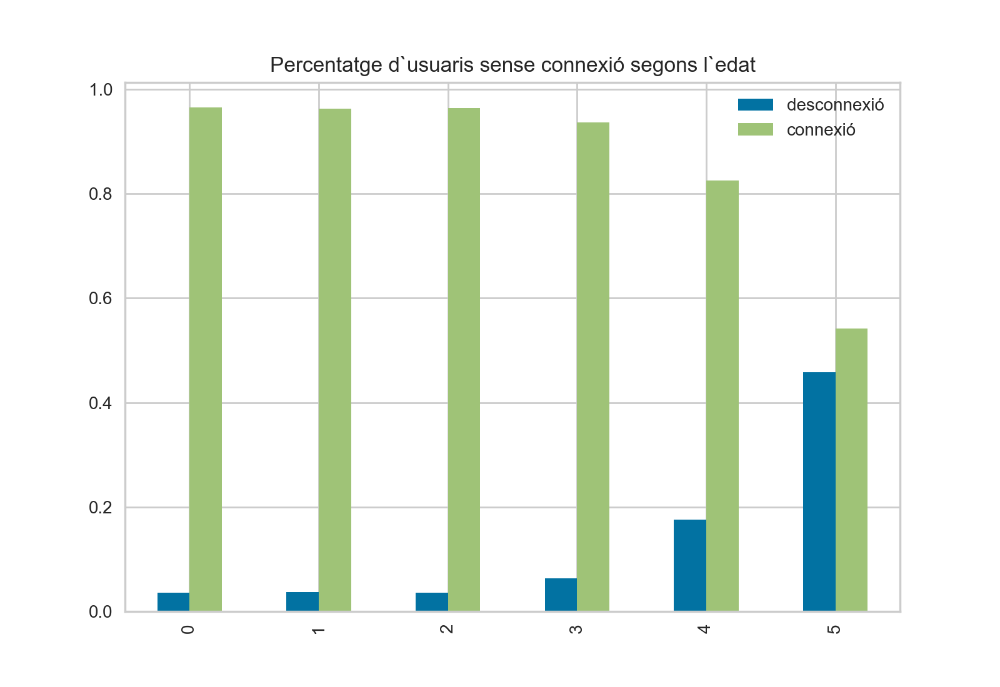

ValueError: The number of FixedLocator locations (6), usually from a call to set_ticks, does not match the number of ticklabels (59).

In [83]:
#Edat
desconnexio = DF_class2[DF_class2['P1']==2]
connexio = DF_class2[DF_class2['P1']==1]
rec_des = pd.value_counts(desconnexio['I3COD'], sort = False).sort_index()
rec_con = pd.value_counts(connexio['I3COD'], sort = False).sort_index()
freq_des = []
freq_con = []
for i,j,k in zip(rec_des, rec_con, [1,2,3,4,5,6]):
    freq_des.append(i/len(DF_class2[DF_class2['I3COD']==k]))
    freq_con.append(j/len(DF_class2[DF_class2['I3COD']==k]))

total = pd.DataFrame()
total['desconnexió'] = pd.DataFrame(freq_des)
total['connexió'] = pd.DataFrame(freq_con)
total.plot(kind='bar', stacked=False, title='Percentatge d`usuaris sense connexió segons l`edat')
plt.xticks(range(6), l['I3COD'])
plt.show()

In [ ]:
#Gènere
desconnexio = DF_class2[DF_class2['P1']==2]
connexio = DF_class2[DF_class2['P1']==1]
rec_des = pd.value_counts(desconnexio['I2'], sort = False).sort_index()
rec_con = pd.value_counts(connexio['I2'], sort = False).sort_index()
freq_des = []
freq_con = []
for i,j,k in zip(rec_des, rec_con, [1,2]):
    freq_des.append(i/len(DF_class2[DF_class2['I2']==k]))
    freq_con.append(j/len(DF_class2[DF_class2['I2']==k]))

total = pd.DataFrame()
total['desconnexió'] = pd.DataFrame(freq_des)
total['connexió'] = pd.DataFrame(freq_con)
total.plot(kind='bar', stacked=False, title='Percentatge d`usuaris sense connexió segons el gènere')
plt.xticks(range(2), l['I2'])
plt.show()

In [ ]:
#Estudis
respost = DF_class2[DF_class2['P30']<98]
estudis = []
for i in respost['P30']:
    if i == 1:
        estudis.append(0)
    else:
        estudis.append(1)

respost['estudis'] = estudis
desconnexio = respost[respost['P1']==2]
connexio = respost[respost['P1']==1]
rec_des = pd.value_counts(desconnexio['estudis'], sort = False).sort_index()
rec_con = pd.value_counts(connexio['estudis'], sort = False).sort_index()
freq_des = []
freq_con = []
for i,j,k in zip(rec_des, rec_con, [0,1]):
    freq_des.append(i/len(respost[respost['estudis']==k]))
    freq_con.append(j/len(respost[respost['estudis']==k]))

total = pd.DataFrame()
total['desconnexió'] = pd.DataFrame(freq_des)
total['connexió'] = pd.DataFrame(freq_con)
total.plot(kind='bar', stacked=False, title='Percentatge d`usuaris sense connexió segons els estudis')
plt.xticks(range(2), ['Sense estudis', 'Amb estudis'])
plt.show()

In [ ]:
#Feina
respost = DF_class2[DF_class2['P31']<98]
estudis = []
for i in respost['P31']:
    if i < 3:
        estudis.append(0)
    elif i == 3:
        estudis.append(1)
    elif i == 4:
        estudis.append(2)
    elif i == 6:
        estudis.append(3)
    else:
        estudis.append(4)


#respost.loc[:,'estudis'] = estudis
respost['estudis'] = estudis
desconnexio = respost[respost['P1']==2]
connexio = respost[respost['P1']==1]
rec_des = pd.value_counts(desconnexio['estudis'], sort = False).sort_index()
rec_con = pd.value_counts(connexio['estudis'], sort = False).sort_index()
freq_des = []
freq_con = []
for i,j,k in zip(rec_des, rec_con, [0,1,2,3,4]):
    freq_des.append(i/len(respost[respost['estudis']==k]))
    freq_con.append(j/len(respost[respost['estudis']==k]))

total = pd.DataFrame()
total['desconnexió'] = pd.DataFrame(freq_des)
total['connexió'] = pd.DataFrame(freq_con)
total.plot(kind='bar', stacked=False, title='Percentatge d`usuaris sense connexió segons els estudis')
plt.xticks(range(5), ['Treballador/a', 'A l’atur', 'Jubilat/ada', 'Estudiant' , 'Altres'])
plt.show()